# Data Sprint
 - Created on Fri Jul 26 17:05:29 2019
 - @author: Victor Faro
 
 
## Summary
1. <a href="#q1">Q1 - Qual a distância média percorrida por viagens com no máximo 2 passageiros</a>
1. <a href="#q2">Q2 - Quais os 3 maiores vendors em quantidade total de dinheiro arrecadado?</a>
1. <a href="#q3">Q3 - Faça um histograma da distribuição mensal, nos 4 anos, de corridas pagas em dinheiro.</a>
1. <a href="#q4">Q4 - Faça um gráfico de série temporal contando a quantidade de gorjetas de cada dia, nos últimos 3 meses de 2012</a>
1. <a href="#bn">Bonus</a>
    1. <a href="#b1">B1 - Quais os 3 maiores vendors em quantidade total de dinheiro arrecadado?</a>
    1. <a href="#b2">B2 - Fazer uma visualização em mapa com latitude e longitude de pickups and dropoffs no ano de 2010</a>
    1. <a href="#b3">B3 - Simular um streaming dos dados dos JSON e fazer uma visualização acompanhando uma métrica em tempo-real¶</a>

In [1]:
%load_ext autoreload
%autoreload 2

# OS module for path manipulation
import os
cwd = os.getcwd()

# Modules for data analysis and eficient number manipulation 
import numpy as np
import pandas as pd
import dask.dataframe as daskframe

# Modules for data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# Modules for time manipulation
from datetime import date , datetime , timedelta
import time

# External module for memory reduction
from low_memory_dataframe import reduce_mem_usage

# Module for Map plotting
import folium

# Removing all warnings from notebook (cleaning visualization)
import warnings
warnings.filterwarnings('ignore')

In [2]:
# List of files
files = ["data-sample_data-nyctaxi-trips-2009-json_corrigido.json" ,
         "data-sample_data-nyctaxi-trips-2010-json_corrigido.json" ,
         "data-sample_data-nyctaxi-trips-2011-json_corrigido.json" ,
         "data-sample_data-nyctaxi-trips-2012-json_corrigido.json" 
         ]

In [3]:
# Reading all files, feature extraction (date columns) , reducing memory allocation , concatenation of dataframes
datasets = []

for file in files:
    _init = time.time()
    print("File: {}".format(file))
    
    f = os.path.join(cwd , "DATA" , file)
    
    dataset = pd.read_json(f , lines=True)
    
    dataset['dropoff_datetime'] = pd.to_datetime(dataset['dropoff_datetime'] , format="%Y-%m-%dT%H:%M:%S")
    dataset['pickup_datetime'] = pd.to_datetime(dataset['pickup_datetime'] , format="%Y-%m-%dT%H:%M:%S")
    
    dataset['dropoff_weekday'] = dataset.dropoff_datetime.dt.weekday_name
    dataset['pickup_weekday'] = dataset.pickup_datetime.dt.weekday_name
    
    dataset['dropoff_hour'] = dataset.dropoff_datetime.dt.hour
    dataset['pickup_hour'] = dataset.pickup_datetime.dt.hour
    dataset['dropoff_minute'] = dataset.dropoff_datetime.dt.minute
    dataset['pickup_minute'] = dataset.pickup_datetime.dt.minute
    dataset['dropoff_second'] = dataset.dropoff_datetime.dt.second
    dataset['pickup_second'] = dataset.pickup_datetime.dt.second
    
    dataset['dropoff_day'] = dataset.dropoff_datetime.dt.day
    dataset['pickup_day'] = dataset.pickup_datetime.dt.day
    dataset['dropoff_month'] = dataset.dropoff_datetime.dt.month
    dataset['pickup_month'] = dataset.pickup_datetime.dt.month
    dataset['dropoff_year'] = dataset.dropoff_datetime.dt.year
    dataset['pickup_year'] = dataset.pickup_datetime.dt.year
    
    dataset.drop(columns=['dropoff_datetime','pickup_datetime'] , inplace=True)
    
    # To optimize memory allocation we are making an manipulation on data type 
    # (python's inference is too inefficient)
    dataset = reduce_mem_usage(dataset)
    _end = time.time()
    print("Execution time: {}".format( _end - _init ))
    
    datasets.append(dataset.copy())

dataframe = pd.concat(datasets)

del dataset , datasets

print(dataframe.info())

File: data-sample_data-nyctaxi-trips-2009-json_corrigido.json
INIT:	221.2525177001953
END:	91.55281066894531
REDUCTION:	41.37933055885153
Execution time: 23.60211420059204
File: data-sample_data-nyctaxi-trips-2010-json_corrigido.json
INIT:	221.2525177001953
END:	91.55281066894531
REDUCTION:	41.37933055885153
Execution time: 46.460119009017944
File: data-sample_data-nyctaxi-trips-2011-json_corrigido.json
INIT:	221.2525177001953
END:	91.55281066894531
REDUCTION:	41.37933055885153
Execution time: 31.180280685424805
File: data-sample_data-nyctaxi-trips-2012-json_corrigido.json
INIT:	221.2525177001953
END:	91.55281066894531
REDUCTION:	41.37933055885153
Execution time: 41.58067202568054
<class 'pandas.core.frame.DataFrame'>
Int64Index: 4000000 entries, 0 to 999999
Data columns (total 29 columns):
dropoff_latitude      float32
dropoff_longitude     float32
fare_amount           float32
passenger_count       uint8
payment_type          object
pickup_latitude       float32
pickup_longitude     

In [4]:
# To make it practical read those files again
# we are going to create an parquet unified file
# in order to only read one file, instead of four
# (and is going to be more performatic)

f = os.path.join(cwd , "DATA" , "df.parquet.gzip")
if not os.path.exists(f):
    # Saving final dataframe as parquet file
    dataframe.to_parquet(fname=f,compression='gzip')
else:
    # If we doesnt have dataframe as variable, read from parquet file
    if not 'dataframe' in globals():
        dataframe = pd.read_parquet(path=f)

In [5]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4000000 entries, 0 to 999999
Data columns (total 29 columns):
dropoff_latitude      float32
dropoff_longitude     float32
fare_amount           float32
passenger_count       uint8
payment_type          object
pickup_latitude       float32
pickup_longitude      float32
rate_code             float64
store_and_fwd_flag    uint8
surcharge             float32
tip_amount            float32
tolls_amount          float32
total_amount          float32
trip_distance         float32
vendor_id             object
dropoff_weekday       object
pickup_weekday        object
dropoff_hour          uint8
pickup_hour           uint8
dropoff_minute        uint8
pickup_minute         uint8
dropoff_second        uint8
pickup_second         uint8
dropoff_day           uint8
pickup_day            uint8
dropoff_month         uint8
pickup_month          uint8
dropoff_year          uint16
pickup_year           uint16
dtypes: float32(10), float64(1), object(4), uint

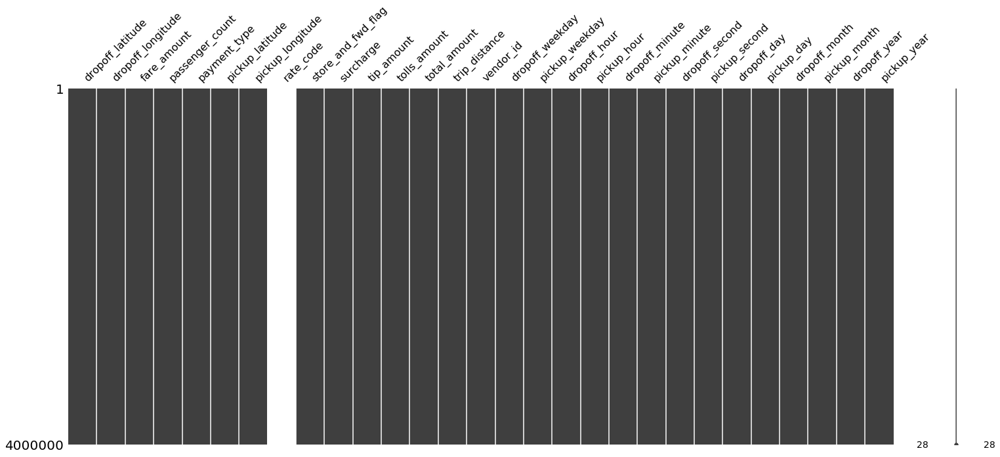

In [6]:
msno.matrix(dataframe)

<div id="q1"></div>

# Question 1
#### Qual a distância média percorrida por viagens com no máximo 2 passageiros?

In [7]:
# Reducing universe for better performance on calculation
q1 = dataframe[dataframe.passenger_count <= 2].trip_distance.mean()

# Result
print("Result: {}".format(q1))

Result: 2.662752628326416


<div id="q2"></div>

# Question 2
#### Quais os 3 maiores vendors em quantidade total de dinheiro arrecadado?

In [8]:
# Read payment options file
f = os.path.join(cwd , "DATA" , "payment.csv")
payment_types = pd.read_csv(f , header=1)

# Let's remove all Foo lookups
valid_options = payment_types[(payment_types.payment_lookup.str.upper() != 'FOO') & (payment_types.payment_lookup != 'Unknown')]
# Make all descriptions upper case
for col in valid_options.columns:
    valid_options[col] = valid_options[col].apply(lambda x: x.upper())

# Remove duplicated descriptions
valid_options = valid_options.drop_duplicates()

# Create an status PAID indicating when the trip was paid and when was not
valid_options['PAID'] = valid_options.apply(lambda x: False if x.payment_lookup in ['NO CHARGE','DISPUTE'] else True , axis=1)
valid_options

,payment_type,payment_lookup,PAID
0,CAS,CASH,True
2,CRE,CREDIT,True
4,NO,NO CHARGE,False
5,DIS,DISPUTE,False
6,CASH,CASH,True
8,CREDIT,CREDIT,True
10,NO CHARGE,NO CHARGE,False
11,DISPUTE,DISPUTE,False
12,CRD,CREDIT,True
13,CSH,CASH,True


In [9]:
# Read vendors file
f = os.path.join(cwd , "DATA" , "vendor.csv")
vendor = pd.read_csv(f , header=0)
vendor['name'] = vendor.name.str.upper()
vendor.rename(columns={'name':'VENDOR_NAME'}, inplace=True)
vendor

,vendor_id,VENDOR_NAME,address,city,state,zip,country,contact,current
0,CMT,"CREATIVE MOBILE TECHNOLOGIES, LLC",950 4th Road Suite 78,Brooklyn,NY,11210,USA,contactCMT@gmail.com,Yes
1,VTS,VERIFONE INC,26 Summit St.,Flushing,NY,11354,USA,admin@vtstaxi.com,Yes
2,DDS,"DEPENDABLE DRIVER SERVICE, INC",8554 North Homestead St.,Bronx,NY,10472,USA,9778896500,Yes
3,TS,TOTAL SOLUTIONS CO,Five Boroughs Taxi Co.,Brooklyn,NY,11229,USA,mgmt@5btc.com,Yes
4,MT,MEGA TAXI,4 East Jennings St.,Brooklyn,NY,11228,USA,contact@megataxico.com,No


In [10]:
# Let's make all payment types upper case (for join purpose)
dataframe.payment_type = dataframe.payment_type.str.upper()

# Joining with valid_options dataframe
dataframe = pd.merge(left=dataframe , right=valid_options , how="left" , on='payment_type')

# Joining with vendor dataframe
dataframe = pd.merge(left=dataframe , right=vendor , how="left" , on='vendor_id')

# Filtering only PAID trips
total_payd = dataframe[dataframe.PAID].groupby('VENDOR_NAME')['total_amount'].sum()

# Sorting by vendor amount and printing result
print(total_payd.sort_values(ascending=False).iloc[0:3])

VENDOR_NAME
CREATIVE MOBILE TECHNOLOGIES, LLC    19381126.00
VERIFONE INC                         19043434.00
DEPENDABLE DRIVER SERVICE, INC        2714901.75
Name: total_amount, dtype: float32


<div id="q3"></div>

# Question 3
#### Faça um histograma da distribuição mensal, nos 4 anos, de corridas pagas em dinheiro.

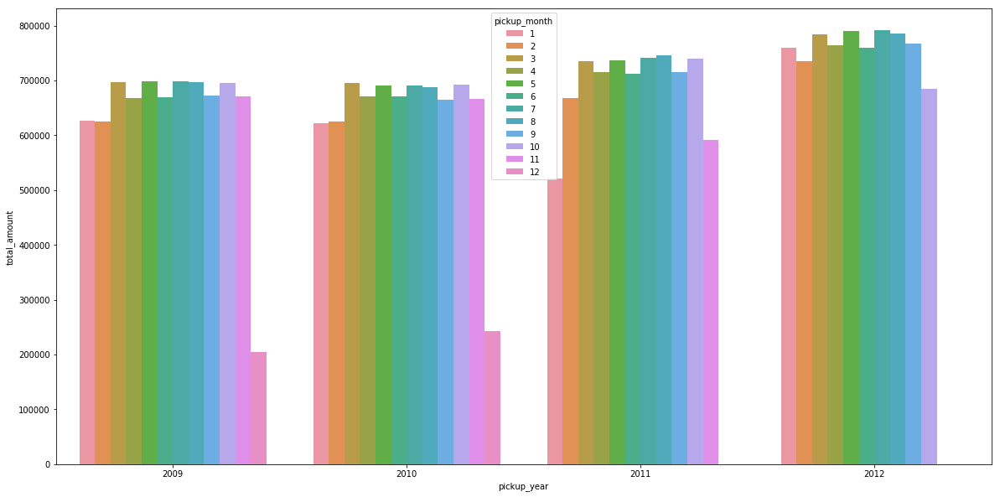

In [11]:
# Selecting only CASH options
cash = dataframe[dataframe.payment_lookup == 'CASH']

# Grouping by year, month and summng total amount
histogram = cash.groupby(['pickup_year','pickup_month'])['total_amount'].sum()

fig , ax = plt.subplots(figsize=(20,10))
sns.barplot(hue='pickup_month' , y='total_amount' , data=histogram.reset_index() , x='pickup_year')

<div id="q4"></div>

# Question 4
#### Faça um gráfico de série temporal contando a quantidade de gorjetas de cada dia, nos últimos 3 meses de 2012.

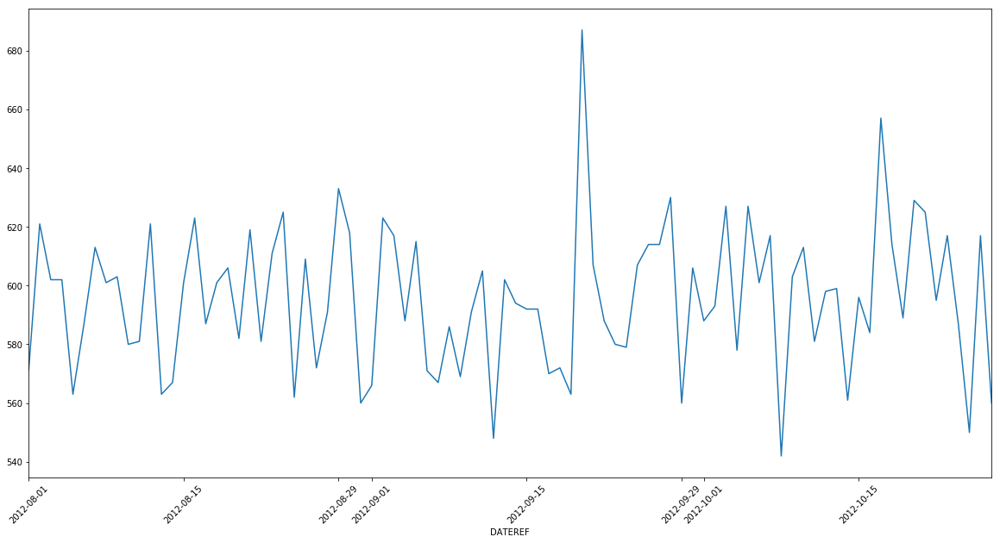

In [12]:
# Retrieving the last 3 months registered in 2012
references = sorted(dataframe[dataframe.pickup_year == 2012].pickup_month.unique().tolist())[-3:]

# Filtering year and months
q4 = dataframe[(dataframe.pickup_year == 2012) & (dataframe.pickup_month.isin(references)) & (~dataframe.payment_type.isin(['NO CHARGE','DISPUTE']))]

def compDate(frame):
    dt = date(frame.pickup_year , frame.pickup_month , frame.pickup_day )
    return dt

# Recalculating Date for Time Series presentation
q4['DATEREF'] = q4.apply(compDate , axis=1)

# Filtering only trips with tip , aggreegating by Date, counting by amount of tip
ts = q4[q4.tip_amount > 0].groupby('DATEREF')['tip_amount'].count()

fig , ax = plt.subplots(figsize=(20,10))
ts.sort_index(ascending=True).plot()
_ = plt.xticks(rotation=45)

<div id="bn"></div>

# Bonus
<div id="b1"></div>

#### Qual o tempo médio das corridas nos dias de sábado e domingo?

In [13]:
def timeElapsed(frame):
    dropoff = datetime(frame.dropoff_year , frame.dropoff_month , frame.dropoff_day , frame.dropoff_hour , frame.dropoff_minute , frame.dropoff_second)
    pickup = datetime(frame.pickup_year , frame.pickup_month , frame.pickup_day , frame.pickup_hour , frame.pickup_minute , frame.pickup_second)
    diff = dropoff - pickup
    return diff

# Creating time spent on trip column
q4['DIFF'] = q4.apply(timeElapsed , axis=1)

# Converting to number for manipulation
q4['new'] = q4['DIFF'].values.astype(np.int64)

# Aggregating in week day
means = q4.groupby('pickup_weekday' , as_index=False)['new'].mean()

# Converting to a readable format
means['DIFF'] = pd.to_timedelta(means['new'])

# Filtering only Saturday and Sunday
print(means[means.pickup_weekday.isin(['Saturday','Sunday'])][['pickup_weekday','DIFF']])

  pickup_weekday            DIFF
2       Saturday 00:08:59.085485
3         Sunday 00:08:59.637036


<div id="b2"></div>

#### Fazer uma visualização em mapa com latitude e longitude de pickups and dropoffs no ano de 2010

In [14]:
# For performance purposes, map visualization was limited to 5000 samples, to see all just set -1 on limit variable
limit = 5000
subset = dataframe[dataframe.pickup_year == 2010].iloc[0:limit]

lon_mean , lat_mean = dataframe.pickup_longitude.mean() , dataframe.pickup_latitude.mean()

m = folium.Map(location=[lat_mean,lon_mean] , tiles='cartodbpositron')

color = {'pickup':'#3186CC' , 'dropoff':'#8B0000'}

for state in ['pickup','dropoff']:
    cor = color[state]
    c = folium.FeatureGroup(name=state)
    for ix , trips in subset.iterrows():
        marker = folium.CircleMarker(
                        [trips['{}_latitude'.format(state)] , trips['{}_longitude'.format(state)]], 
                        popup=trips['vendor_id'] , radius=2, color=cor , fill_color=cor)
        c.add_children(marker)
    c.add_to(m)
    del c
    
folium.LayerControl().add_to(m)
m


<div id="b3"></div> 

#### Simular um streaming dos dados dos JSON e fazer uma visualização acompanhando uma métrica em tempo-real

<IPython.core.display.Javascript object>


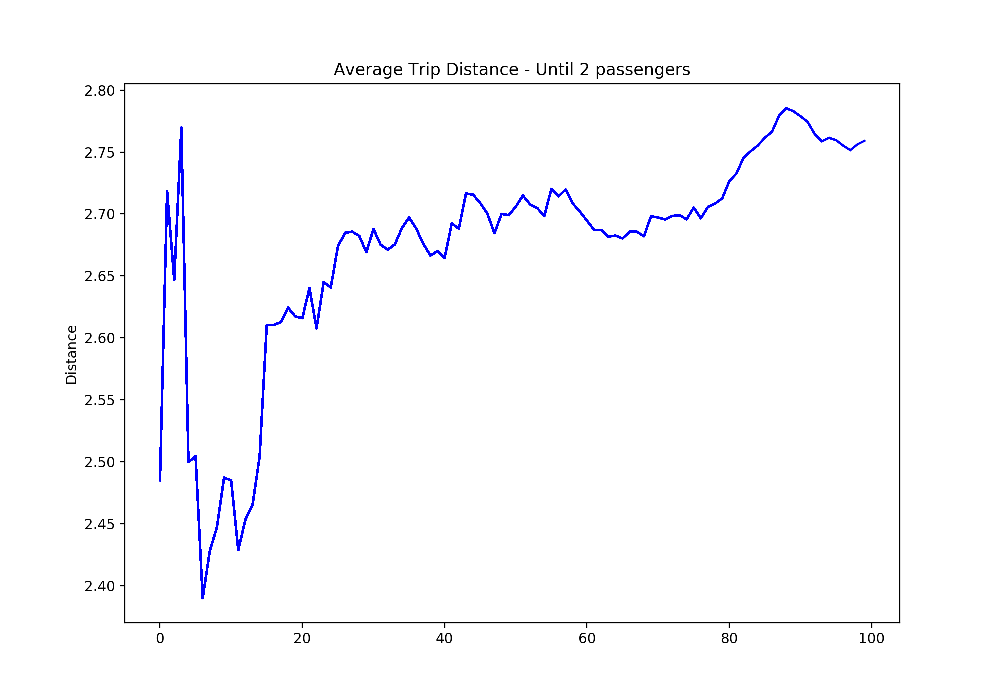

In [17]:
# Configs
%matplotlib notebook
plt.rcParams['animation.html'] = 'jshtml'

fig , ax = plt.subplots(figsize=(10,7))
ax.set_title("Average Trip Distance - Until 2 passengers")
ax.set_ylabel("Distance")
fig.show()

# run cell below to start real time visualization

In [18]:
def index_marks(nrows, chunk_size):
    return range(1 * chunk_size, (nrows // chunk_size + 1) * chunk_size, chunk_size)

def split(frame, chunk_size):
    indices = index_marks(frame.shape[0], chunk_size)
    return np.split(frame, indices)

def getDateString(frame):
    try:
        value = date(frame.pickup_year , frame.pickup_month , frame.pickup_day)
    except:
        print(frame)
        raise
    return value

subset['D'] = subset.apply(getDateString,axis=1)

# Subset was defined in map question (one above)
chunks = split(subset.sort_values(by='D' , ascending=True) , 50)

size = len(chunks)
x , y = [] , []

# Iterate through chunks (reading and ploting acumulative data presented by chunks - simulating entries)
for i in range(size):
    
    temporal = pd.concat(chunks[0:i+1])
    tmp = chunks[i]
    
    if tmp.shape[0] > 0 :        
        
        if temporal.shape[0] > 0:
            r = temporal[temporal.passenger_count <= 2].trip_distance.mean()

        x.append(i)
        y.append(r)

        ax.plot(x , y , c='blue')

        fig.canvas.draw()

        time.sleep(0.2)